Pairs Trading is a quantitative trading strategy invented and popularized by the trading team at Morgan Stanley, designed to produce market-neutral returns. It is a long-short strategy that consists of trading two (or more, in case of statistical arbitrage) stocks that are co-integrated, taking advantage of temporary relative mispricings. 

The first stage (aside from hypothesis generation) is together and examine the market data:

In [1]:
import pandas as pd 
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scienceplots
import warnings
warnings.filterwarnings("ignore")
''' my directory'''
filepaths = {
    'Banking':  'D:\my stuff\LSTM Papers\Datasets\Banking',
    'General': 'D:\my stuff\LSTM Papers\Datasets\General',
}

plt.style.use(['science','no-latex'])
start = '2017'
end = '07/07/2023'

''' volume is followed by M in case of millions and K in case of thousands'''
def volumeconvert(volume):
  if (volume[len(volume)-1]=='M'):
    return 1000*float(volume[:len(volume)-1])
  elif (volume[len(volume)-1] == 'K'):
    return float(volume[:len(volume)-1])
  else:
    return float(volume)
  
''' preps the prices dataframe'''

def clean_stock(tickername):
  tickername = tickername.drop('Change %', axis = 1)
  tickername['Date']= pd.to_datetime(tickername['Date'], format='%m/%d/%Y')
  tickername.sort_values('Date',inplace = True)
  tickername = tickername.set_index('Date')
  tickername['Vol.'] = tickername['Vol.'].astype(str)
  tickername['Vol.'] = tickername['Vol.'].apply(volumeconvert, convert_dtype = True)
  tickername = tickername.astype(str)
  tickername = tickername.replace(',', '', regex = True)
  tickername = tickername.astype(float)
  
  return tickername

closing = pd.DataFrame(index = pd.date_range(
    start = start,
    end = end,
    freq = '1D'
))

dir = filepaths['Banking']
output = [os.path.join(dir, p) for p in os.listdir(dir)]
onlyfiles = [f.split()[0] for f in os.listdir(dir)]

for i, j in zip(output, onlyfiles):
    stock = pd.read_csv(i)
    stock = clean_stock(stock)
    closing[str(j)] = stock['Price']



dir = filepaths['General']
output = [os.path.join(dir, p) for p in os.listdir(dir)]
onlyfiles = [f.split()[0] for f in os.listdir(dir)]

for i, j in zip(output, onlyfiles):
    stock = pd.read_csv(i)
    stock = clean_stock(stock)
    closing[str(j)] = stock['Price']


opening = pd.DataFrame(index = pd.date_range(
    start = start,
    end = end,
    freq = '1D'
))

dir = filepaths['Banking']
output = [os.path.join(dir, p) for p in os.listdir(dir)]
onlyfiles = [f.split()[0] for f in os.listdir(dir)]

for i, j in zip(output, onlyfiles):
    stock = pd.read_csv(i)
    stock = clean_stock(stock)
    opening[str(j)] = stock['Open']



dir = filepaths['General']
output = [os.path.join(dir, p) for p in os.listdir(dir)]
onlyfiles = [f.split()[0] for f in os.listdir(dir)]

for i, j in zip(output, onlyfiles):
    stock = pd.read_csv(i)
    stock = clean_stock(stock)
    opening[str(j)] = stock['Open']

opening = opening.shift(freq=pd.Timedelta(hours=2))
closing = closing.shift(freq=pd.Timedelta(hours=6))

m = pd.concat([opening, closing], axis = 1).stack().reset_index()
m = m.pivot(index = 'level_0', columns = 'level_1').reset_index()
m.columns = m.columns.droplevel(0)
m.index = m[m.columns[0]]
m = m.drop(m.columns[0], axis = 1)

log_returns = np.log(m).diff().fillna(0)
log_returns = pd.DataFrame(np.where(np.abs(log_returns) >= 1, 0, log_returns), columns= log_returns.columns, index = log_returns.index)

We split our asset universe time series to 3 sets: a training set, which we will use for pair selection and parametric estimation.

In [2]:
def rolling_cv(data, n_splits):
    len_splits = int(len(data)/(n_splits))
    splits = []
    for i in range(n_splits+1):
        split = data.iloc[i*len_splits: (i+1)*len_splits]
        splits.append(split)
    return splits


train, validation, test = rolling_cv(log_returns.cumsum(), 3)[0:3]

Text(0.5, 1.0, 'Asset Universe History')

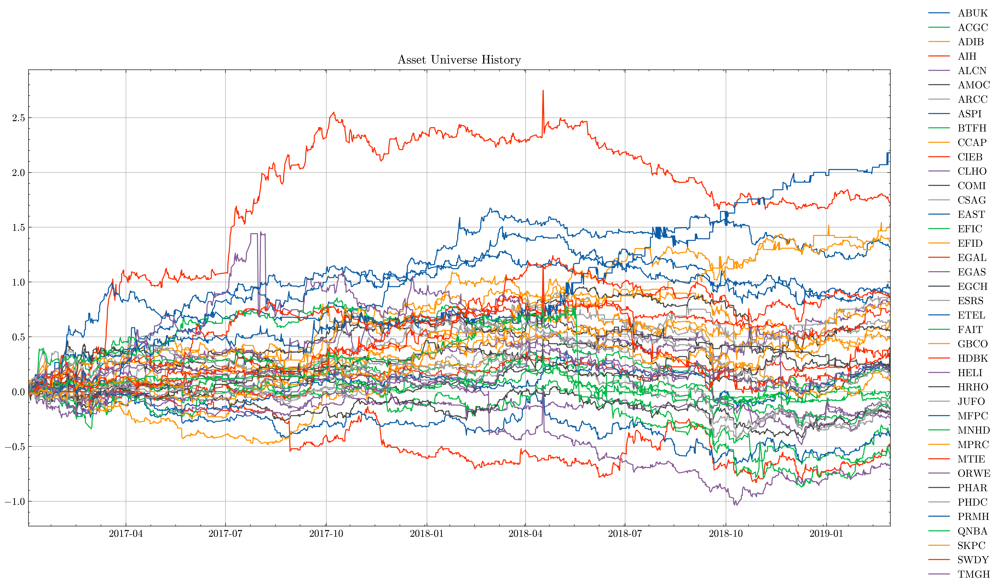

In [3]:
fig, ax = plt.subplots(figsize=(15,8), dpi = 400)
m = train.copy()
ax.plot(m)
fig.legend(m.columns)
ax.set_xlim([m.index[0], m.index[-1]])
ax.grid()
ax.set_title('Asset Universe History')

Pair Selection

There are several methods for pair selection, the one we will use in this notebook is the distance approach:

$P^{\mu}_{i} = \frac{\sum\limits_{t}{P_{i,t}}}{N}$

$P^{\sigma}_{i} = \sqrt{(P^{\mu}_{i})^2 - \frac{\sum\limits_{t}{P_{i,t}^2}}{N}}$

$P^{standardized}_{i, t} = \frac{P_{i,t} - P^{\mu}_{i}}{P^{\sigma}_{i}} $

$SS_{i,j} = \sum\limits_{t}{(P^{standardized}_{i, t})^2 - (P^{standardized}_{j, t})^2}$

Pairs i & j are sorted according to $SS_{i,j}$, the pairs with the least $SS_{i,j}$ are then deemed candidates for pairs trading


In [4]:
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import dendrogram, linkage
# price dataframe 'm' is standardized
m -= m.mean()
m /= m.std()
# scipy has an implementation of dozens of distance measures
# there are many distance measures that can be used, however here we will keep it vanilla
dist_matrix_condensed = pdist(m.T, metric = 'euclidean')
# convert it from list to square form
dist_matrix_sqaure = squareform(dist_matrix_condensed, checks = True)

fig, axes = plt.subplots(1,1,figsize = (20,20), dpi = 400)
ax = axes
# make a heatmap out of the matrix
sns.heatmap(dist_matrix_sqaure, ax = ax)
# make it look chique
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)
ax.set_xticklabels(log_returns.columns, rotation = 90, fontsize = 15)
img = ax.set_yticklabels(log_returns.columns, rotation = 0, fontsize = 15)

ax.set_title(r'$SS_{i,j} Matrix$', fontsize = 30)

fig.tight_layout()

Text(0, 0.5, '$SS_{i,j}$')

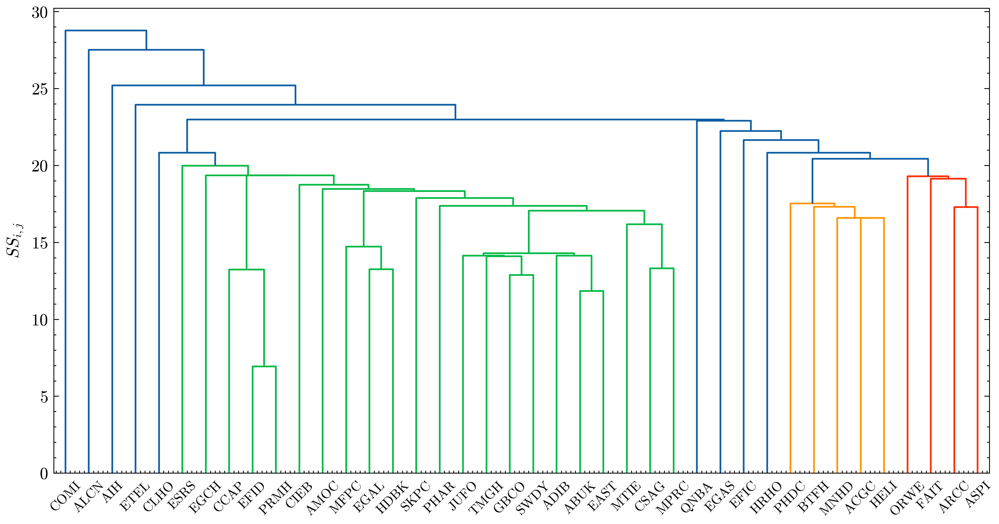

In [5]:
fig, axes = plt.subplots(1,1,figsize = (10,5), dpi = 400)
ax = axes
# this converts the distance measure list (list, NOT the matrix form)
# into a matrix of clusters
Z = linkage(dist_matrix_condensed)
# plots the matrix in the form of a dendrogram
dn = dendrogram(Z, ax = ax, labels = log_returns.columns)
ax.set_ylabel(r'$SS_{i,j}$')



The different color-codes for each set of branches indicate that this is a basket of stocks that are ‘closer’ to each other than others outside of the basket. For example, a look at the orange basket (PHDC, BTFH, MNHD, ACGC, HELI)

Text(0.5, 1.0, 'Orange basket stocks')

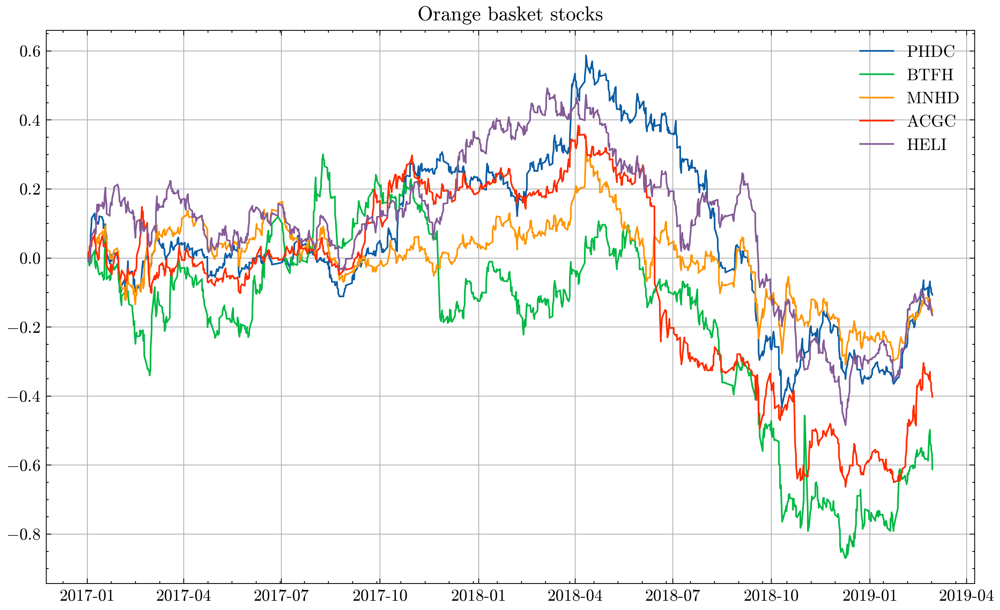

In [6]:
chosen_pair = ['PHDC', 'BTFH', 'MNHD', 'ACGC', 'HELI']

fig, ax = plt.subplots(figsize = (10,6), dpi = 400)

ax.plot(train[chosen_pair], label = chosen_pair)
ax.legend()
ax.grid()
ax.set_title('Orange basket stocks')

The pair with the least $SS_{i,j}$ is the EFID/PRMH pair

Text(0.5, 1.0, 'Pair Candidate')

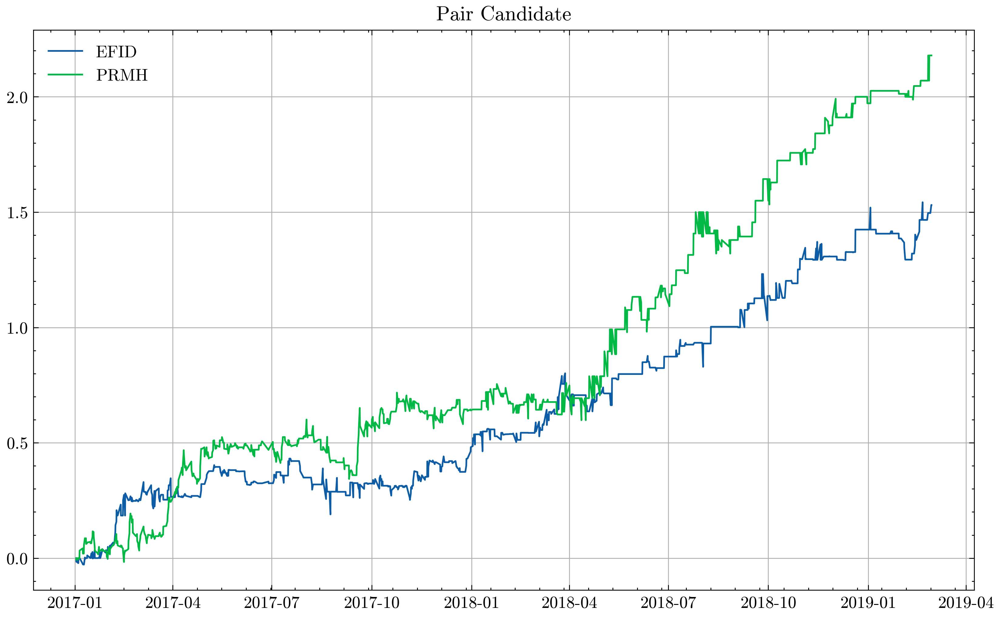

In [7]:
chosen_pair = ['EFID', 'PRMH']

fig, ax = plt.subplots(figsize = (10,6), dpi = 400)

ax.plot(train[chosen_pair], label = chosen_pair)
ax.legend()
ax.grid()
ax.set_title('Pair Candidate')

The pairs are then tested for cointegration using the Engle-Granger test.

They are found to be significantly cointegrated since the test's p-value < 0.05 but > 0.01

In [8]:
from statsmodels.tsa.stattools import coint

results = coint(m[chosen_pair[1]], m[chosen_pair[0]], trend = 'n')

print(results)

(-2.969037560096026, 0.02938396786509812, [nan, nan, nan])


The hedge ratio $\beta$ can be calculated in two ways:

First method is using the average returns of both tickers

$R_{a,t} - \beta R_{b,t} = \eta_t$

$\eta_t \sim \mathcal{N}(0,\sigma^2) $

$ \beta = \frac{E[R_{a,t}]}{E[R_{b,t}]}$



In [9]:
train[chosen_pair[1]].diff().fillna(0).mean()/train[chosen_pair[0]].diff().fillna(0).mean()

1.423605061967696

The second method is by regressing the price or log-price series of on asset onto the other one

In [10]:
from statsmodels.regression.linear_model import OLS
import statsmodels.api as sm
# train dataframe holds the training log price series
# chosen_pair[1] is PRMH and chosen_pair[0] is EFID
model = OLS(train[chosen_pair[1]], sm.add_constant(train[chosen_pair[0]]), hasconst=False).fit()

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                   PRMH   R-squared (uncentered):                   0.986
Model:                            OLS   Adj. R-squared (uncentered):              0.986
Method:                 Least Squares   F-statistic:                          3.658e+04
Date:                Thu, 24 Aug 2023   Prob (F-statistic):                        0.00
Time:                        13:10:03   Log-Likelihood:                          655.26
No. Observations:                1054   AIC:                                     -1307.
Df Residuals:                    1052   BIC:                                     -1297.
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0458      0.008     -6.086      0.000      -0.061      -0.031
EFID           1.4368      0.010    149.169      0.000       1.418       1.456
==============================================================================
Omnibus:                       35.168   Durbin-Watson:                   0.126
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               39.403
Skew:                          -0.412   Prob(JB):                     2.78e-09
Kurtosis:                       3.466   Cond. No.                         3.59
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Text(0.5, 1.0, 'PRMH/EFID Spread Standardized')

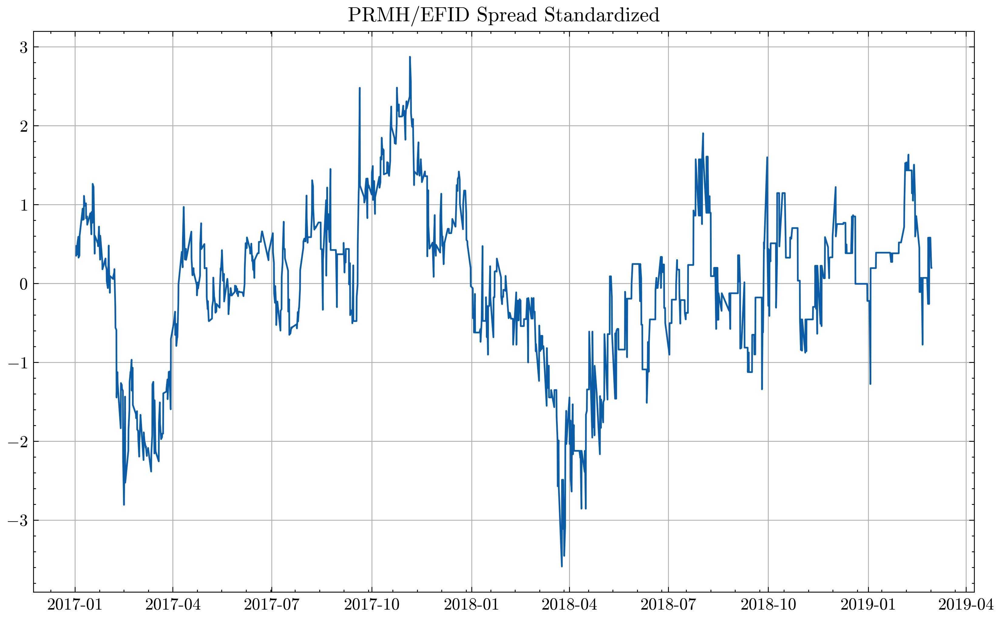

In [11]:
predictions = model.predict(sm.add_constant(train[chosen_pair[0]]))

residuals = train[chosen_pair[1]] - predictions

fig, ax = plt.subplots(figsize = (10,6), dpi = 400)

residuals_std = residuals - residuals.mean()
residuals_std /= residuals_std.std()

ax.plot(residuals_std)
ax.grid()
ax.set_title(f'{chosen_pair[1]}/{chosen_pair[0]} Spread Standardized')

The test-statistic (-2.968)lies between the 1% and 5% significance levels (-3.437, -2.864), suggesting that the spread is almost non-stationary. For the purpose of this series, this spread will be deemed tradable (don’t do this in real life).

In [12]:
from statsmodels.tsa.stattools import adfuller

adfuller(residuals_std)

(-2.9684127724633003,
 0.037951406014309526,
 13,
 1040,
 {'1%': -3.4366533786777778,
  '5%': -2.864323084781805,
  '10%': -2.568251827847633},
 569.0316727368117)

Most of the stochastic processes literature originated from modelling particles’ motion in a gas, a term you might know as Brownian Motion:

$dX_t = \sigma dW_t$

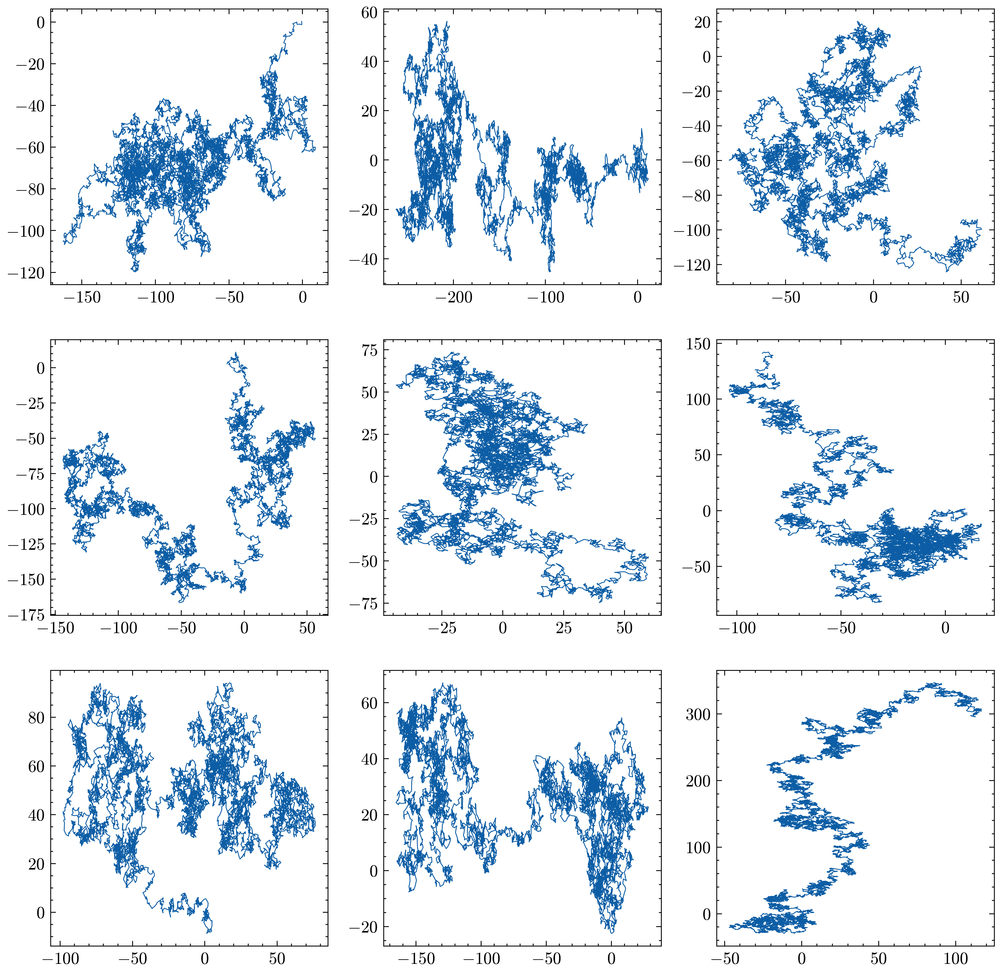

In [13]:
import scipy
distribution = scipy.stats.norm(0,1)

fig, axes = plt.subplots(3,3, figsize = (10,10), dpi = 400)

motions_x = distribution.rvs(size =(9,10000))
motions_y = distribution.rvs(size =(9,10000))

for ax, x, y in zip(axes.flatten(), motions_x, motions_y):
    ax.plot(x.cumsum(),y.cumsum(), linewidth = 0.5)

The Ornstein_Uhlenbeck class implements the Ornstein-Uhlenbeck process, which is a type of mean-reverting stochastic process. It is used to model the evolution of a spread over time. The class has methods for fitting the model to data, calculating the log-likelihood of the data given the model, and simulating data from the model.

The fit method fits the Ornstein-Uhlenbeck model to the given spread data using either Maximum Likelihood Estimation (MLE) or Least Squares. The log_likelihood method calculates the log-likelihood of the given spread data given the fitted model. The simulate method simulates observations from the fitted Ornstein-Uhlenbeck model.

This class provides a convenient way to work with Ornstein-Uhlenbeck processes in Python. It can be used for tasks such as modeling financial time series or analyzing noisy data.

In [14]:
from statsmodels.tsa.ar_model import AutoReg
import scipy
from stochastic.processes.diffusion import VasicekProcess

class Ornstein_Uhlenbeck():

    """
    This class implements the Ornstein-Uhlenbeck process, which is a type of mean-reverting stochastic process. 
    It is used to model the evolution of a spread over time.
    
    The class has methods for fitting the model to data, calculating the log-likelihood of the data given the model, 
    and simulating data from the model.
    """
    def __init__(self):
        """
        Initializes an instance of the Ornstein_Uhlenbeck class.
        """
        pass

    def fit(self, spread, delta_t=1, method = 'MLE'):

        """
        Fits the Ornstein-Uhlenbeck model to the given spread data using either Maximum Likelihood Estimation (MLE) or Least Squares.
        
        :param spread: The spread data to fit the model to.
        :type spread: pandas.Series
        :param delta_t: The time step between observations in the spread data.
        :type delta_t: float
        :param method: The method to use for fitting the model. Either 'MLE' or 'Least-squares'.
        :type method: str
        """

        
        if method == 'MLE':
            X_x = spread.shift(1).fillna(0).sum()
            X_y = spread.sum()
            X_xx = (spread.shift(1).fillna(0)**2).sum()
            X_yy = (spread**2).sum()
            X_xy = (spread*spread.shift(1).fillna(0)).sum()
            n = len(spread)
            """
            theta is the process mean
            mu is the mean reversion strength
            sigma is the residual volatility
            """
            self.theta = (X_y*X_xx - X_x*X_xy)/(n*(X_xx - X_xy) - X_x**2 + X_x*X_y)

            self.mu = np.log(X_xy - self.theta*X_x - self.theta*X_y + n*self.theta**2) 
            self.mu -= np.log(X_xx - 2*self.theta*X_x + n*self.theta**2)
            self.mu /= -delta_t

            bracket_one = 2*self.mu/(n*(1-np.exp(-2*self.mu*delta_t)))
            bracket_two = X_yy - 2*np.exp(-self.mu*delta_t)*X_xy + np.exp(-2*self.mu*delta_t)*X_xx - 2*self.theta*(1-np.exp(-self.mu*delta_t))*(X_y - np.exp(-self.mu*delta_t)*X_x) + n*(self.theta*(1-np.exp(-self.mu*delta_t)))**2

            self.volatility = np.sqrt(bracket_one*bracket_two)
        elif method == 'Least-squares':
            model = AutoReg(spread,exog = np.ones(len(spread)),lags = 1, trend = 'n').fit()

            beta, constant = model.params.values[0], model.params.values[1]

            self.mu = - np.log(beta) / delta_t
            self.theta = constant/(1-beta)

            residuals = spread - beta*spread.shift(1).fillna(0) - constant
            self.volatility = np.std(residuals)*np.sqrt(2*self.mu/(1-beta**2))

    def log_likelihood(self, spread):

        """
        Calculates the log-likelihood of the given spread data given the fitted model.
        
        :param spread: The spread data to calculate the log-likelihood for.
        :type spread: pandas.Series
        :return: The log-likelihood of the spread data given the fitted model.
        :rtype: float
        """

        proxy_volatility = self.volatility * ((1 - np.exp(-2*self.mu))/(2*self.mu))**0.5
        summation_term = (spread - spread.shift(1).fillna(0)*np.exp(-self.mu) - self.theta*(1-np.exp(-self.mu)))**2

        return -0.5*np.log(2*3.1415) - np.log(proxy_volatility) - summation_term.sum()*0.5/(len(spread) * proxy_volatility**2)

    def simulate(self, N):

        """
        Simulates N observations from the fitted Ornstein-Uhlenbeck model.
        
        :param N: The number of observations to simulate.
        :type N: int
        :return: A tuple containing the simulated observations and their corresponding times.
        :rtype: tuple
        """

        
        diffuser = VasicekProcess(speed = self.mu,mean = self.theta, vol = self.volatility, t = N)

        return diffuser.sample(N, initial = 0), diffuser.times(N)



Now we can simulate an arbitrary number of O-U processes with any parameters we want

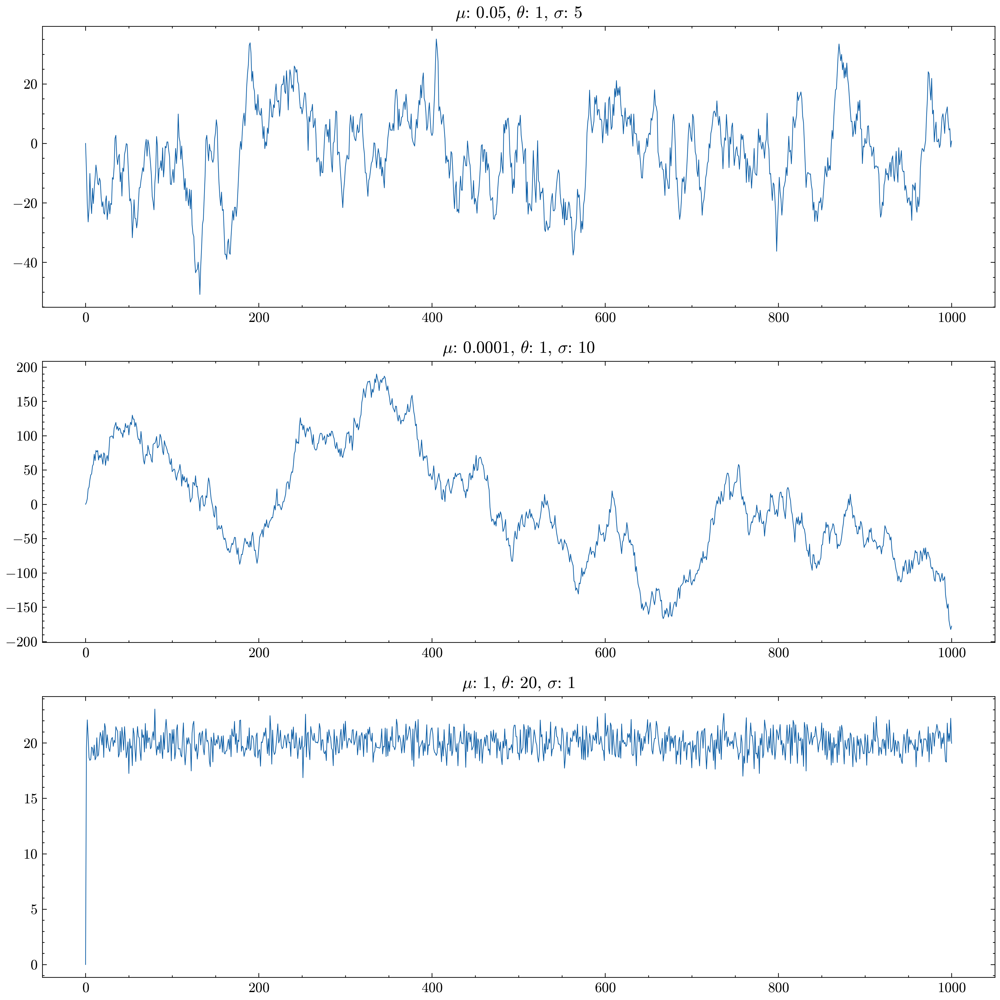

In [15]:
fig, ax = plt.subplots(3,1, figsize = (10,10), dpi = 400)

mean_reversion = Ornstein_Uhlenbeck()
mean_reversion.mu = 0.05
mean_reversion.volatility = 5
mean_reversion.theta = 1
N = 1000
OU_process, time = mean_reversion.simulate(N)

ax[0].plot(time, OU_process, linewidth = 0.5)
ax[0].set_title(r'$\mu$: '+f'{mean_reversion.mu}, '+ r'$\theta$: '+f'{mean_reversion.theta}, '+ r'$\sigma$: '+f'{mean_reversion.volatility}')
mean_reversion.mu = 0.0001
mean_reversion.volatility = 10
mean_reversion.theta = 1
N = 1000
OU_process, time = mean_reversion.simulate(N)
ax[1].set_title(r'$\mu$: '+f'{mean_reversion.mu}, '+ r'$\theta$: '+f'{mean_reversion.theta}, '+ r'$\sigma$: '+f'{mean_reversion.volatility}')
ax[1].plot(time, OU_process, linewidth = 0.5)

mean_reversion.mu = 1
mean_reversion.volatility = 1
mean_reversion.theta = 20
N = 1000
OU_process, time = mean_reversion.simulate(N)
ax[2].set_title(r'$\mu$: '+f'{mean_reversion.mu}, '+ r'$\theta$: '+f'{mean_reversion.theta}, '+ r'$\sigma$: '+f'{mean_reversion.volatility}')
ax[2].plot(time, OU_process, linewidth = 0.5)

fig.tight_layout()

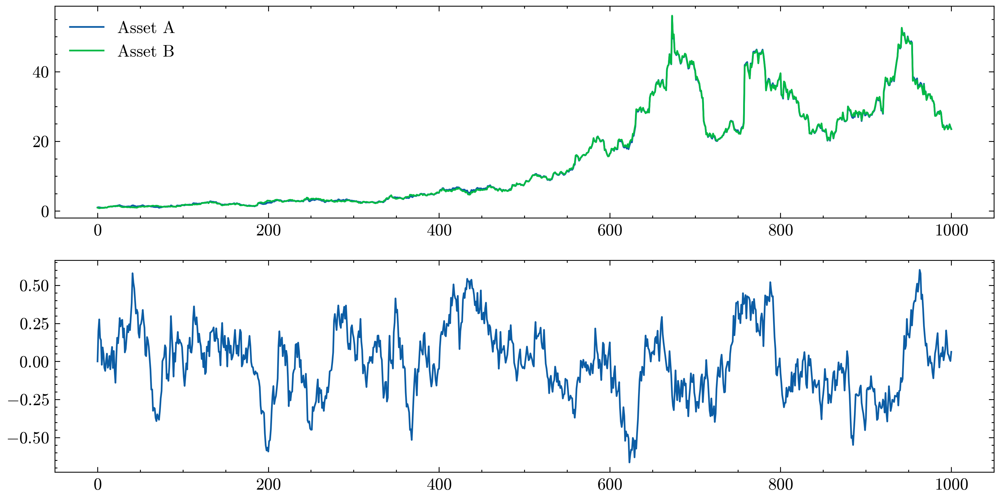

In [16]:
from stochastic.processes.continuous import GeometricBrownianMotion

mean_reversion.mu = 0.05
mean_reversion.volatility = 0.04
mean_reversion.theta = 0
N = 1000
OU, time = mean_reversion.simulate(N)

x = np.exp(scipy.stats.t(df = 3, loc = 0, scale = 0.03).rvs(N+1).cumsum())

asset1 = x + OU
asset1 /= asset1[0]
asset2 = x - OU
asset2 /= asset2[0]
fig, ax = plt.subplots(2,1, figsize = (10,5), dpi = 400)
ax[0].plot(asset1, label = 'Asset A')
ax[0].plot(asset2, label = 'Asset B')
ax[0].legend()

ax[1].plot(asset1 - asset2)

In [17]:
def pairs_signals(spread, threshold_enter, threshold_exit):
    positions = pd.Series(data = np.zeros(len(spread)), index = spread.index)
    position = 0
    print('Beginning Backtest')
    for i in range(len(spread)):
        print(f'Day {i}')
        if position == 0:
            print('Checking for available positions')
            if bool(spread.iloc[i] < threshold_enter and spread.iloc[i-1] > threshold_enter) is True:
                position = -1
                print('Shorting')
            elif bool(spread.iloc[i] > -threshold_enter and spread.iloc[i-1] < -threshold_enter) is True:
                position = 1
                print('Longing')
            else: 
                pass
        elif position == -1:
            print('Checking for cover opportunities')
            if bool(spread.iloc[i] < threshold_exit and spread.iloc[i-1] > threshold_exit) is True:
                position = 0
                print('Covering Short Position')
            else: 
                pass
        elif position == 1:
            print('Checking for sell opportunities')
            if bool(spread.iloc[i] > -threshold_exit and spread.iloc[i-1] < -threshold_exit) is True:
                position = 0
                print('Selling Long Position')
            else: 
                pass
        else: 
            continue

        positions.iloc[i] = position
    
    return positions

Beginning Backtest
Day 0
Checking for available positions
Shorting
Day 1
Checking for cover opportunities
Day 2
Checking for cover opportunities
Day 3
Checking for cover opportunities
Day 4
Checking for cover opportunities
Day 5
Checking for cover opportunities
Covering Short Position
Day 6
Checking for available positions
Day 7
Checking for available positions
Longing
Day 8
Checking for sell opportunities
Day 9
Checking for sell opportunities
Day 10
Checking for sell opportunities
Day 11
Checking for sell opportunities
Day 12
Checking for sell opportunities
Day 13
Checking for sell opportunities
Day 14
Checking for sell opportunities
Day 15
Checking for sell opportunities
Day 16
Checking for sell opportunities
Day 17
Checking for sell opportunities
Day 18
Checking for sell opportunities
Day 19
Checking for sell opportunities
Day 20
Checking for sell opportunities
Day 21
Checking for sell opportunities
Day 22
Checking for sell opportunities
Day 23
Checking for sell opportunities
Day 24

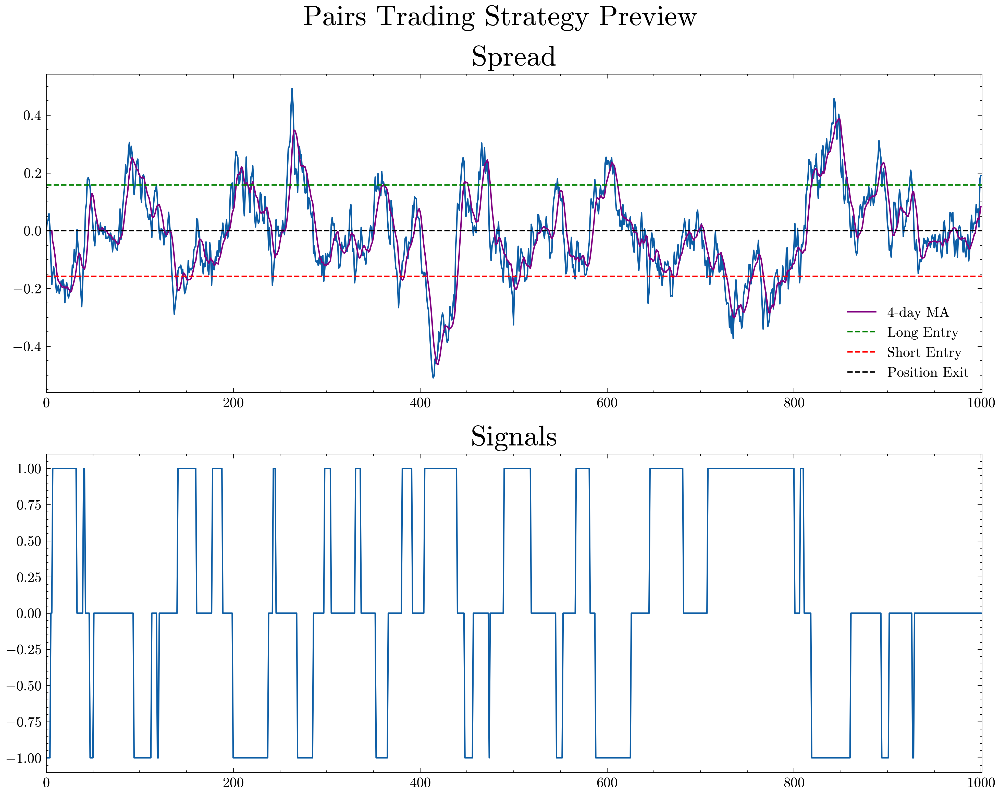

In [18]:
mean_reversion.mu = 0.05
mean_reversion.volatility = 0.05
mean_reversion.theta = 0
N = 1000
OU, time = mean_reversion.simulate(N)

long_thres = mean_reversion.theta + np.sqrt((mean_reversion.volatility)**2/(2*mean_reversion.mu))
exit_thres = mean_reversion.theta


fig, ax = plt.subplots(2,1, figsize = (10,8), dpi = 400)
ax[0].plot(time, OU)
ax[0].plot(pd.Series(OU).rolling(8).mean().fillna(0), label = '4-day MA', c = 'purple')
ax[0].axhline(long_thres, c = 'green', linestyle = '--', label = 'Long Entry')
ax[0].axhline(-long_thres, c = 'red', linestyle = '--', label = 'Short Entry')
ax[0].axhline(exit_thres, c = 'black', linestyle = '--', label = 'Position Exit')
ax[0].legend()
ax[0].set_title('Spread', fontsize = 20)
ax[0].set_xlim(0, len(OU))
pos = pairs_signals(pd.Series(OU), long_thres, exit_thres)
ax[1].plot(pos)
ax[1].set_title('Signals', fontsize = 20)
ax[1].set_xlim(0, len(OU))

fig.suptitle('Pairs Trading Strategy Preview', fontsize = 20)
fig.tight_layout()

We estimate the confidence intervals for the spread using a parametrized bootstrapping approach

In [19]:
mus = []
for i in range(2000):
    mean_reversion = Ornstein_Uhlenbeck()
    mean_reversion.fit(residuals, delta_t = 0.5)
    process = mean_reversion.simulate(len(train))[0]
    mean_reversion = Ornstein_Uhlenbeck()
    mean_reversion.fit(pd.Series(process))
    mus.append(mean_reversion.mu)


In [26]:
predictions = model.predict(sm.add_constant(train[chosen_pair[0]]))
residuals = train[chosen_pair[1]] - predictions
mean_reversion.fit(residuals, delta_t = 0.5)

print('mu' + f' {mean_reversion.mu}')
print('theta' + f' {mean_reversion.theta}')
print('sigma' +f' {mean_reversion.volatility}')

print('tau = ' f'{np.log(2)/mean_reversion.mu}')

mu 0.13054114256733396
theta 0.0003596865832348916
sigma 0.06640670107702863
tau = 5.309798634575421


Text(0.5, 1.0, '$\\tau$ Bootstrap distribution')

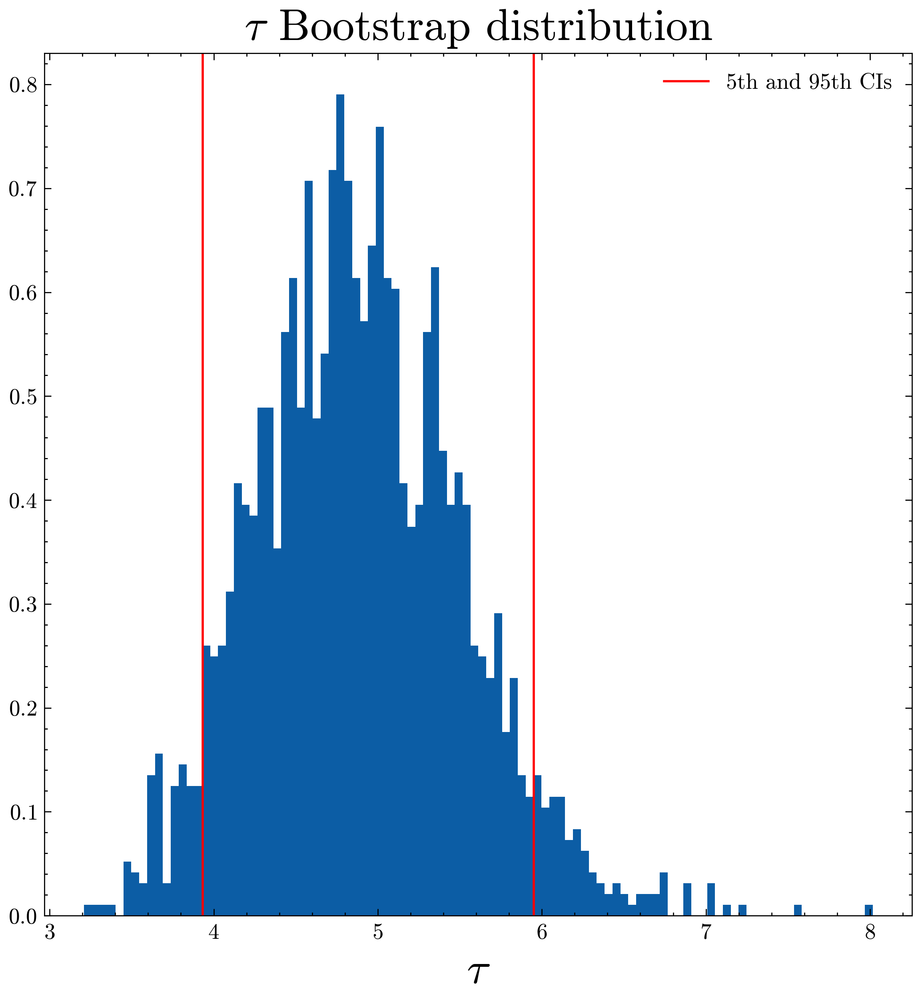

In [27]:
fig, ax = plt.subplots(1, figsize = (7,7), dpi = 400)



time_constant = np.log(2)/mus
img = ax.hist(time_constant, bins = 100, density=True)
ax.axvline(np.percentile(time_constant,95), c = 'red', label = '5th and 95th CIs')
ax.axvline(np.percentile(time_constant,5), c = 'red')
ax.legend()
ax.set_xlabel(r'$\tau$', fontsize =20)
ax.set_title(r'$\tau$ Bootstrap distribution', fontsize =20)

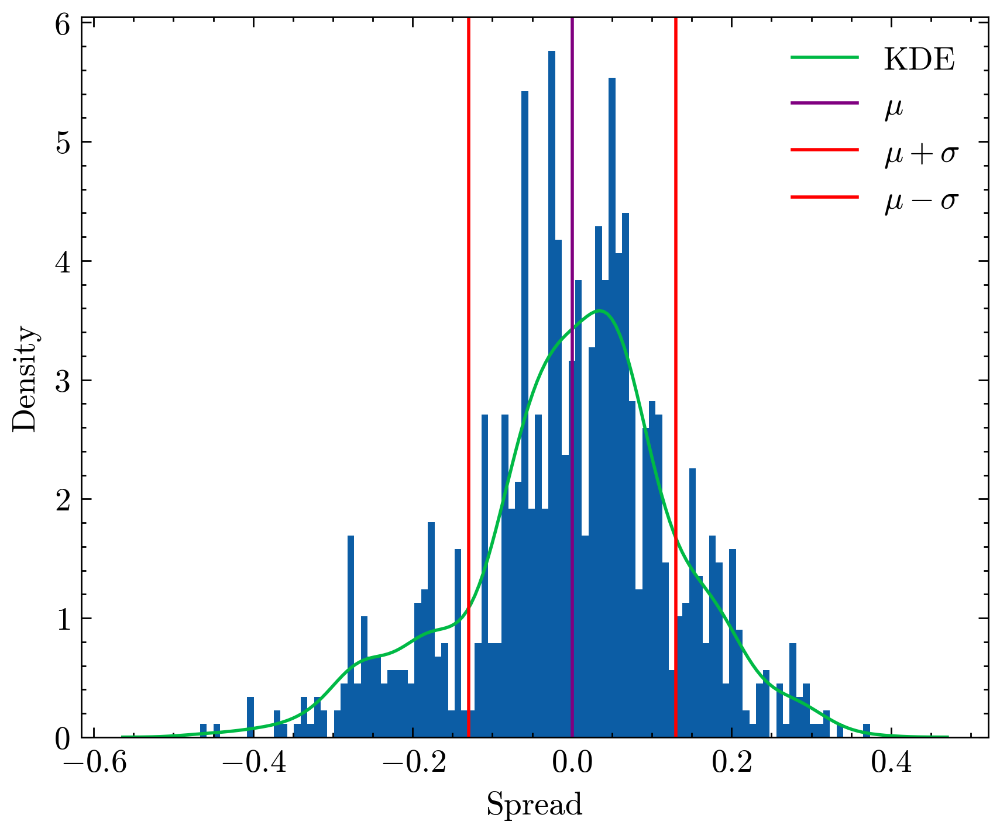

In [28]:
fig, ax = plt.subplots(figsize = (5,4), dpi = 400)

ax.hist(residuals, bins = 100, density = True)
sns.kdeplot(residuals, ax=ax, label = 'KDE')
ax.axvline(residuals.mean(), c = 'purple', label = r'$\mu$')
ax.axvline(residuals.mean() + residuals.std(), c = 'red', label = r'$\mu + \sigma$')
ax.axvline(residuals.mean() - residuals.std(), c = 'red', label = r'$\mu - \sigma$')

ax.set_xlabel('Spread')
ax.legend()

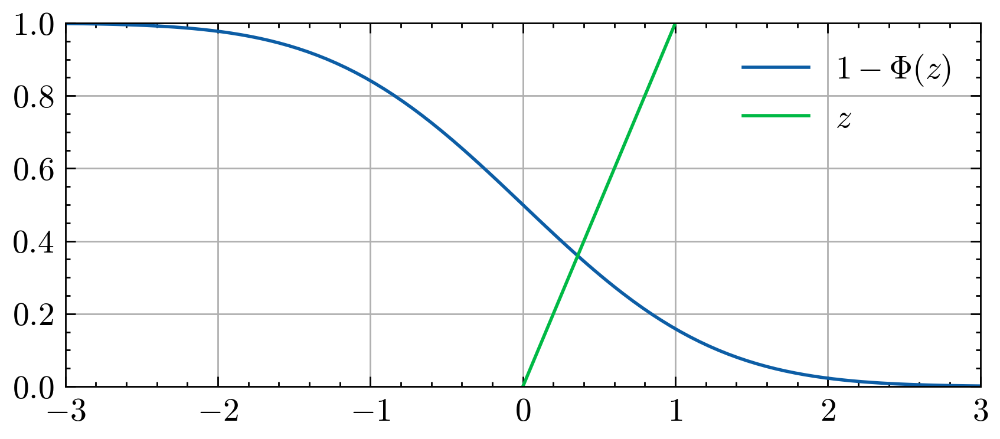

In [29]:
import scipy

x = np.linspace(-3.1,3.1,100)

sf = scipy.stats.norm(0,1).sf(x)

fig, axes = plt.subplots(1, 1, figsize = (5,2), dpi = 400)

ax = axes
ax.plot(x,sf, label = r'$1-\Phi(z)$')
ax.plot(x,x, label = r'$z$')
ax.set_ylim(0,1)
ax.set_xlim(-3,3)
ax.grid()
ax.legend()



In [30]:
def pairs_signals(spread, threshold_enter, threshold_exit):
    positions = pd.Series(data = np.zeros(len(spread)), index = spread.index)
    position = 0
    print('Beginning Backtest')
    for i in range(len(spread)):
        print(f'Day {i}')
        if position == 0:
            print('Checking for available positions')
            if bool(spread.iloc[i] < threshold_enter and spread.iloc[i-1] > threshold_enter) is True:
                position = -1
                print('Shorting')
            elif bool(spread.iloc[i] > -threshold_enter and spread.iloc[i-1] < -threshold_enter) is True:
                position = 1
                print('Longing')
            else: 
                pass
        elif position == -1:
            print('Checking for cover opportunities')
            if bool(spread.iloc[i] < threshold_exit and spread.iloc[i-1] > threshold_exit) is True:
                position = 0
                print('Covering Short Position')
            else: 
                pass
        elif position == 1:
            print('Checking for sell opportunities')
            if bool(spread.iloc[i] > -threshold_exit and spread.iloc[i-1] < -threshold_exit) is True:
                position = 0
                print('Selling Long Position')
            else: 
                pass
        else: 
            continue

        positions.iloc[i] = position
    
    return positions

def backtest( returns, signals, commision_fixed = 4, commision_percentage = 0.008,initial_capital = 1000):
    fixed_costs = signals.diff().fillna(0)**2*commision_fixed
    returns = returns - commision_percentage*signals.diff().fillna(0)**2
    strategy_returns = returns.shift(-1).fillna(0)*signals
    value = strategy_returns.cumsum().apply(np.exp)
    value /= value.iloc[0]
    value *= initial_capital
    value -= fixed_costs.cumsum()
    value /= initial_capital

    return np.log(value)
    

In [31]:
c = 0.8

T = np.log((np.sqrt((c**2 - 3)**2 + 4*c**2) + c**2 - 3)/2 + 1)/mus

Text(0.5, 1.0, '$T_{hold}$ Bootstrap distribution')

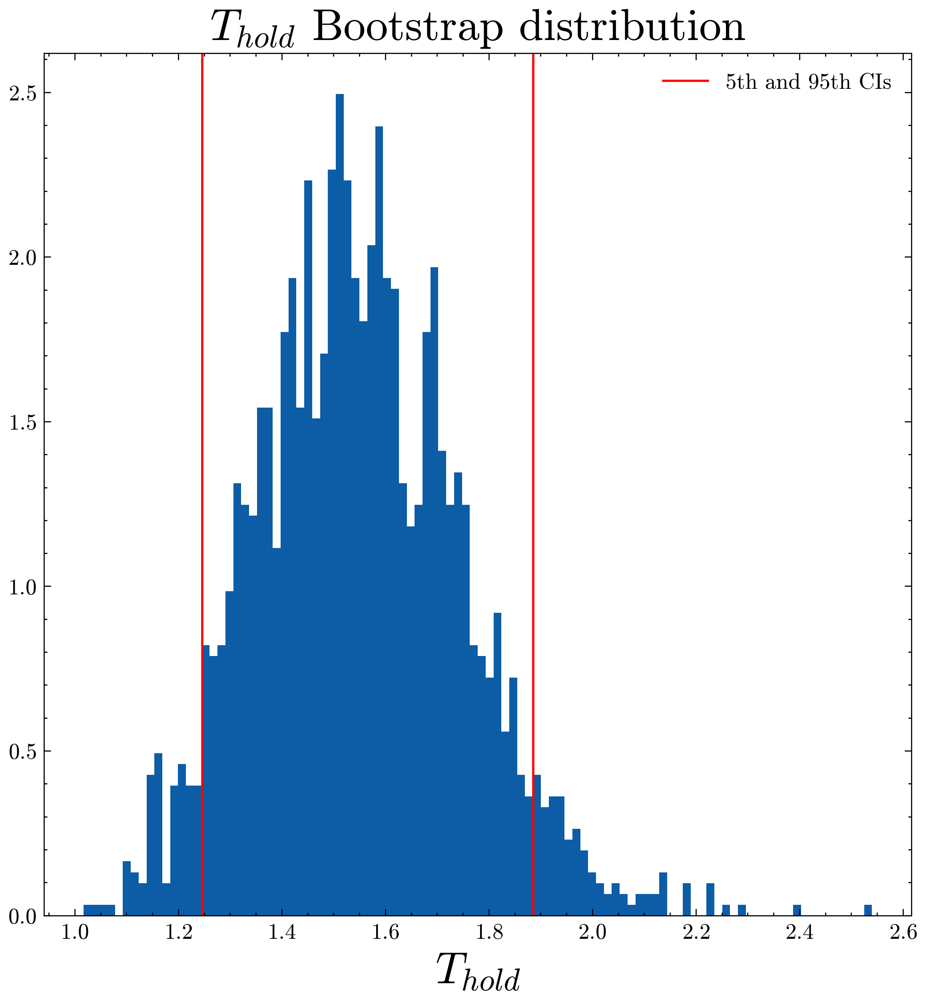

In [32]:
fig, ax = plt.subplots(1, figsize = (7,7), dpi = 400)

img = ax.hist(T, bins = 100, density=True)
ax.axvline(np.percentile(T,95), c = 'red', label = '5th and 95th CIs')
ax.axvline(np.percentile(T,5), c = 'red')
ax.legend()
ax.set_xlabel(r'$T_{hold}$', fontsize =20)
ax.set_title(r'$T_{hold}$ Bootstrap distribution', fontsize =20)

In [57]:
def pairs_signals(spread, threshold_enter, threshold_exit, max_hold_time = 7):
    positions = pd.Series(data = np.zeros(len(spread)), index = spread.index)
    position = 0
    print('Beginning Backtest')
    for i in range(len(spread)):
        print(f'Day {i}')
        if position == 0:
            holding_time = 0
            print('Checking for available positions')
            if bool(spread.iloc[i] < threshold_enter and spread.iloc[i-1] > threshold_enter) is True:
                position = -1
                print('Shorting')
            elif bool(spread.iloc[i] > -threshold_enter and spread.iloc[i-1] < -threshold_enter) is True:
                position = 1
                print('Longing')
            else: 
                pass
        elif position == -1:
            holding_time += 1
            print(f'Checking for cover opportunities, hold time: {holding_time}, spread: {spread.iloc[i]}')
            if bool(spread.iloc[i] < threshold_exit and spread.iloc[i-1] > threshold_exit) is True:
                position = 0
                print('Covering Short Position')
            elif bool(holding_time > max_hold_time and np.abs(spread.iloc[i]) > 2*threshold_enter) is True:
                position = 0
                print('Closing for risk management')
            else: 
                pass
        elif position == 1:
            holding_time += 1
            print(f'Checking for sell opportunities, hold time: {holding_time}, spread: {spread.iloc[i]}')
            if bool(spread.iloc[i] > -threshold_exit and spread.iloc[i-1] < -threshold_exit) is True:
                position = 0
                print('Selling Long Position')
            elif bool(holding_time > max_hold_time and np.abs(spread.iloc[i]) > 2*threshold_enter) is True:
                position = 0
                print('Closing for risk management')
            else: 
                pass
        else: 
            continue

        positions.iloc[i] = position
    
    return positions

Beginning Backtest
Day 0
Checking for available positions
Day 1
Checking for available positions
Day 2
Checking for available positions
Day 3
Checking for available positions
Day 4
Checking for available positions
Day 5
Checking for available positions
Day 6
Checking for available positions
Day 7
Checking for available positions
Day 8
Checking for available positions
Day 9
Checking for available positions
Day 10
Checking for available positions
Day 11
Checking for available positions
Day 12
Checking for available positions
Day 13
Checking for available positions
Day 14
Checking for available positions
Day 15
Checking for available positions
Day 16
Checking for available positions
Day 17
Checking for available positions
Shorting
Day 18
Checking for cover opportunities, hold time: 1, spread: 0.11556790718193283
Day 19
Checking for cover opportunities, hold time: 2, spread: 0.1103279217065554
Day 20
Checking for cover opportunities, hold time: 3, spread: 0.08090409296111493
Day 21
Checkin

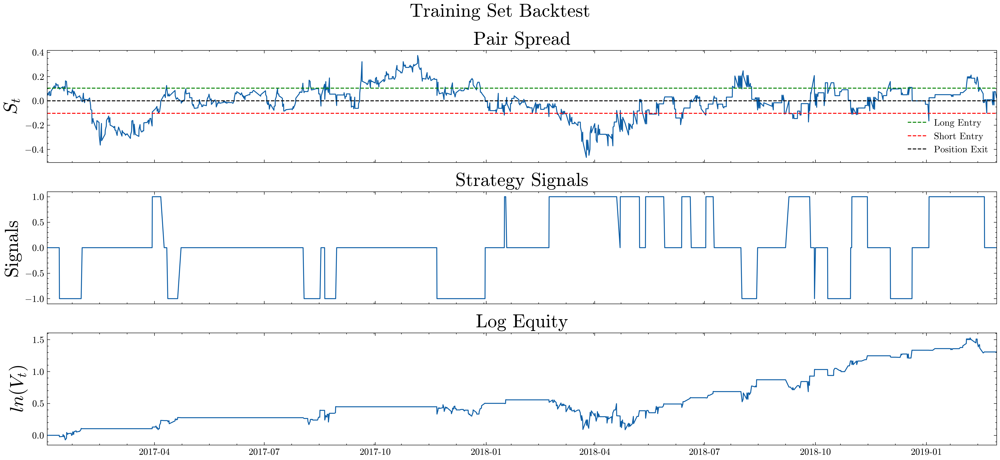

In [58]:
fig, ax = plt.subplots(3,1, figsize = (15,7), dpi = 400, sharex='col')
fontsize = 20
predictions = model.predict(sm.add_constant(train[chosen_pair[0]]))
residuals = train[chosen_pair[1]] - predictions
mean_reversion = Ornstein_Uhlenbeck()
mean_reversion.fit(residuals, delta_t = 1/504)
ax[0].plot(residuals)
long_thres = mean_reversion.theta + 0.8*np.sqrt((mean_reversion.volatility)**2/(2*mean_reversion.mu))
short_thres = mean_reversion.theta - 0.8*np.sqrt((mean_reversion.volatility)**2/(2*mean_reversion.mu))
exit_thres = mean_reversion.theta
ax[0].axhline(long_thres, c = 'green', linestyle = '--', label = 'Long Entry')
ax[0].axhline(short_thres, c = 'red', linestyle = '--', label = 'Short Entry')
ax[0].axhline(exit_thres, c = 'black', linestyle = '--', label = 'Position Exit')
ax[0].legend()

signals = pairs_signals(residuals, long_thres, exit_thres, 74)
ax[1].plot(signals)
log_returns_ = residuals.diff().fillna(0)
ax[2].plot(backtest(log_returns_, signals))

ax[0].set_title('Pair Spread', fontsize=fontsize)
ax[1].set_title('Strategy Signals', fontsize=fontsize)
ax[2].set_title('Log Equity', fontsize=fontsize)


ax[2].set_ylabel(r'$ln(V_t)$', fontsize=fontsize)
ax[0].set_ylabel(r'$S_t$', fontsize=fontsize)
ax[1].set_ylabel(r'Signals', fontsize=fontsize)

ax[2].set_xlim(log_returns_.index[0], log_returns_.index[-1])

fig.suptitle('Training Set Backtest', fontsize=fontsize)
fig.tight_layout()

Beginning Backtest
Day 0
Checking for available positions
Shorting
Day 1
Checking for cover opportunities, hold time: 1, spread: 0.025570114728922455
Day 2
Checking for cover opportunities, hold time: 2, spread: 0.025570114728922455
Day 3
Checking for cover opportunities, hold time: 3, spread: 0.014996291453418298
Day 4
Checking for cover opportunities, hold time: 4, spread: 0.013376433982687619
Day 5
Checking for cover opportunities, hold time: 5, spread: 0.03582405172998193
Day 6
Checking for cover opportunities, hold time: 6, spread: 0.016537675921394435
Day 7
Checking for cover opportunities, hold time: 7, spread: 0.0366332961469551
Day 8
Checking for cover opportunities, hold time: 8, spread: 0.0366332961469551
Day 9
Checking for cover opportunities, hold time: 9, spread: 0.021335054082276095
Day 10
Checking for cover opportunities, hold time: 10, spread: 0.016537675921394435
Day 11
Checking for cover opportunities, hold time: 11, spread: 0.016537675921394435
Day 12
Checking for c

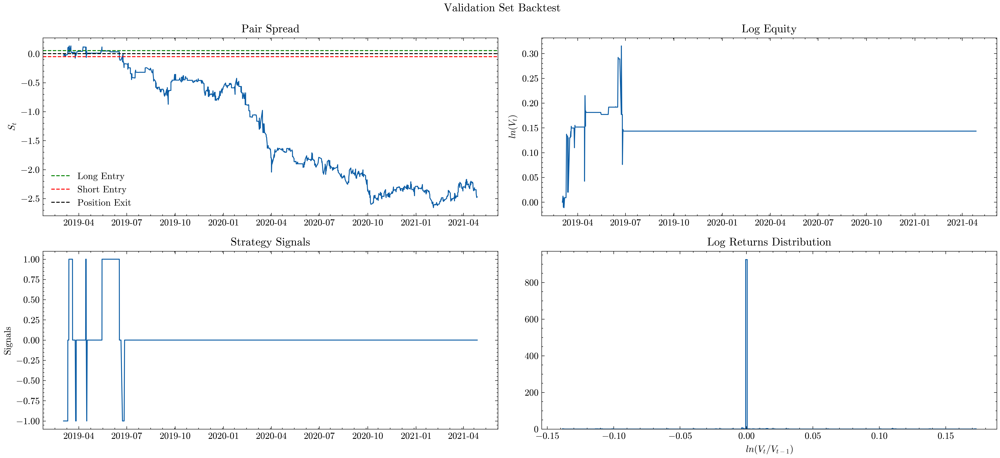

In [36]:
fig, ax = plt.subplots(2,2, figsize = (15,7), dpi = 400)
predictions = model.predict(sm.add_constant(validation[chosen_pair[0]]))
residuals = validation[chosen_pair[1]] - predictions
ax[0,0].plot(-residuals)
ax[0,0].axhline(long_thres, c = 'green', linestyle = '--', label = 'Long Entry')
ax[0,0].axhline(short_thres, c = 'red', linestyle = '--', label = 'Short Entry')
ax[0,0].axhline(exit_thres, c = 'black', linestyle = '--', label = 'Position Exit')
signals = pairs_signals(residuals, long_thres, exit_thres)
ax[1,0].plot(signals)
log_returns_ = residuals.diff().fillna(0)
ax[0,1].plot(backtest(log_returns_, signals))
img = ax[1,1].hist(backtest(log_returns_, signals).diff().fillna(0), bins = 300, histtype = 'step', density= True)

ax[0,0].set_title('Pair Spread')
ax[1,0].set_title('Strategy Signals')
ax[0,1].set_title('Log Equity')
ax[1,1].set_title('Log Returns Distribution')

ax[0,1].set_ylabel(r'$ln(V_t)$')
ax[1,1].set_xlabel(r'$ln(V_t/V_{t-1})$')
ax[0,0].set_ylabel(r'$S_t$')
ax[1,0].set_ylabel(r'Signals')
ax[0,0].legend()

fig.suptitle('Validation Set Backtest')
fig.tight_layout()

Beginning Backtest
Day 0
Checking for available positions
Day 1
Checking for available positions
Day 2
Checking for available positions
Day 3
Checking for available positions
Day 4
Checking for available positions
Day 5
Checking for available positions
Day 6
Checking for available positions
Day 7
Checking for available positions
Day 8
Checking for available positions
Day 9
Checking for available positions
Day 10
Checking for available positions
Day 11
Checking for available positions
Day 12
Checking for available positions
Day 13
Checking for available positions
Day 14
Checking for available positions
Day 15
Checking for available positions
Day 16
Checking for available positions
Day 17
Checking for available positions
Day 18
Checking for available positions
Day 19
Checking for available positions
Day 20
Checking for available positions
Day 21
Checking for available positions
Day 22
Checking for available positions
Day 23
Checking for available positions
Day 24
Checking for available p

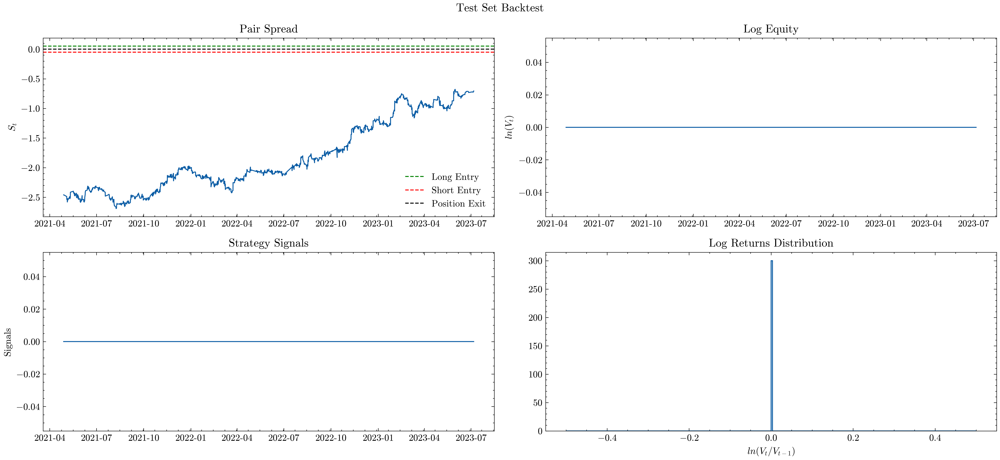

In [37]:
fig, ax = plt.subplots(2,2, figsize = (15,7), dpi = 400)
predictions = model.predict(sm.add_constant(test[chosen_pair[0]]))
residuals = test[chosen_pair[1]] - predictions
ax[0,0].plot(-residuals)
ax[0,0].axhline(long_thres, c = 'green', linestyle = '--', label = 'Long Entry')
ax[0,0].axhline(short_thres, c = 'red', linestyle = '--', label = 'Short Entry')
ax[0,0].axhline(exit_thres, c = 'black', linestyle = '--', label = 'Position Exit')
signals = pairs_signals(residuals, long_thres, exit_thres)
ax[1,0].plot(signals)
log_returns_ = residuals.diff().fillna(0)
ax[0,1].plot(backtest(log_returns_, signals))
img = ax[1,1].hist(backtest(log_returns_, signals).diff().fillna(0), bins = 300, histtype = 'step', density= True)

ax[0,0].set_title('Pair Spread')
ax[1,0].set_title('Strategy Signals')
ax[0,1].set_title('Log Equity')
ax[1,1].set_title('Log Returns Distribution')

ax[0,1].set_ylabel(r'$ln(V_t)$')
ax[1,1].set_xlabel(r'$ln(V_t/V_{t-1})$')
ax[0,0].set_ylabel(r'$S_t$')
ax[1,0].set_ylabel(r'Signals')
ax[0,0].legend()

fig.suptitle('Test Set Backtest')
fig.tight_layout()

C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


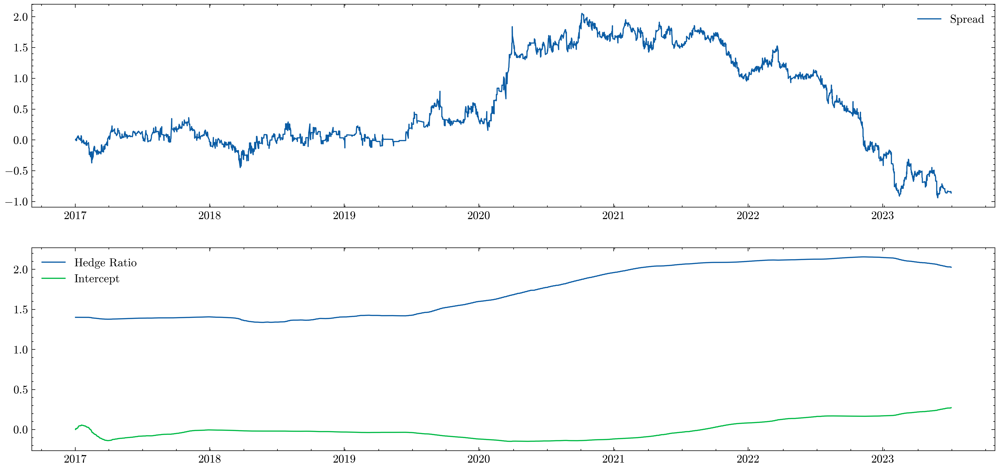

In [60]:
from statsmodels.regression.recursive_ls import RecursiveLS
spread = log_returns.cumsum()
model_recursive = RecursiveLS(spread[chosen_pair[1]], sm.add_constant(spread[chosen_pair[0]]), hasconst=False)
model_recursive.initialize_known([0, 1.4], np.array([[10**10,0],
                                                   [0,10**-2]]))

res = model_recursive.fit()

beta_series = res.recursive_coefficients['filtered'][1]
const_series = res.recursive_coefficients['filtered'][0]

predictions = beta_series*spread[chosen_pair[0]] + const_series
fig, ax = plt.subplots(2,1, figsize = (15,7), dpi = 400)

ax[0].plot(spread[chosen_pair[1]] - predictions, label = 'Spread')
ax[0].legend()
ax[1].plot(pd.Series(beta_series, index = spread.index), label = 'Hedge Ratio')
ax[1].plot(pd.Series(const_series, index = spread.index), label = 'Intercept')
ax[1].legend()


Beginning Backtest
Day 0
Checking for available positions
Longing
Day 1
Checking for sell opportunities, hold time: 1, spread: 0.007847945295761945
Day 2
Checking for sell opportunities, hold time: 2, spread: -0.003943720988259272
Day 3
Checking for sell opportunities, hold time: 3, spread: 0.010312204886298422
Day 4
Checking for sell opportunities, hold time: 4, spread: 0.016753634860519177
Day 5
Checking for sell opportunities, hold time: 5, spread: -0.014033956816952098
Day 6
Checking for sell opportunities, hold time: 6, spread: -0.009167182290675051
Day 7
Checking for sell opportunities, hold time: 7, spread: 0.02066979662947787
Day 8
Checking for sell opportunities, hold time: 8, spread: 0.05734042736192153
Day 9
Checking for sell opportunities, hold time: 9, spread: 0.034816827935893704
Day 10
Checking for sell opportunities, hold time: 10, spread: 0.032553874487800935
Day 11
Checking for sell opportunities, hold time: 11, spread: 0.06510165049498869
Day 12
Checking for sell opp

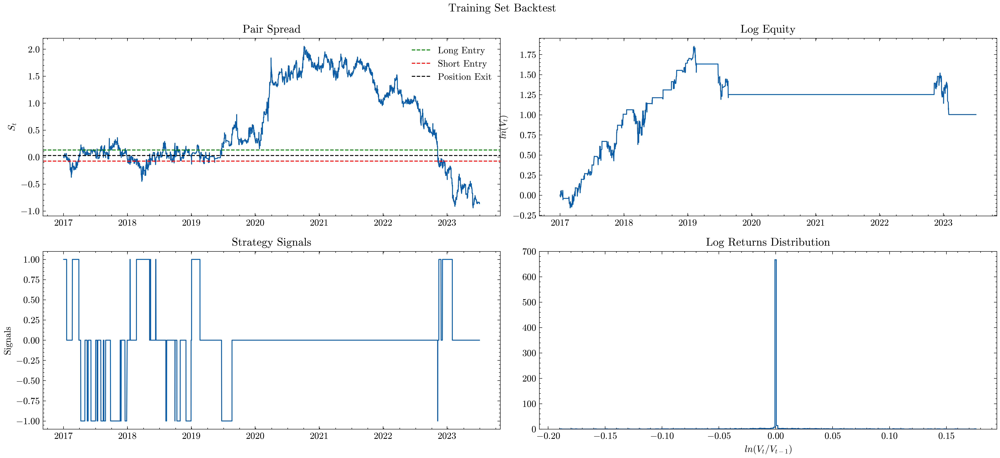

In [61]:
fig, ax = plt.subplots(2,2, figsize = (15,7), dpi = 400)
mean_reversion = Ornstein_Uhlenbeck()
residuals = spread[chosen_pair[1]] - predictions
mean_reversion.fit(residuals.loc[train.index[0]:train.index[-1]], delta_t = 1/504)
ax[0,0].plot(residuals)
long_thres = mean_reversion.theta + 0.8*np.sqrt((mean_reversion.volatility)**2/(2*mean_reversion.mu))
short_thres = mean_reversion.theta - 0.8*np.sqrt((mean_reversion.volatility)**2/(2*mean_reversion.mu))
exit_thres = mean_reversion.theta
ax[0,0].axhline(long_thres, c = 'green', linestyle = '--', label = 'Long Entry')
ax[0,0].axhline(short_thres, c = 'red', linestyle = '--', label = 'Short Entry')
ax[0,0].axhline(exit_thres, c = 'black', linestyle = '--', label = 'Position Exit')
ax[0,0].legend()
signals = pairs_signals(residuals, long_thres, exit_thres, 74)
ax[1,0].plot(signals)
log_returns_ = residuals.diff().fillna(0)
ax[0,1].plot(backtest(log_returns_, signals))
img = ax[1,1].hist(backtest(log_returns_, signals).diff().fillna(0), bins = 300, histtype = 'step', density= True)

ax[0,0].set_title('Pair Spread')
ax[1,0].set_title('Strategy Signals')
ax[0,1].set_title('Log Equity')
ax[1,1].set_title('Log Returns Distribution')

ax[0,1].set_ylabel(r'$ln(V_t)$')
ax[1,1].set_xlabel(r'$ln(V_t/V_{t-1})$')
ax[0,0].set_ylabel(r'$S_t$')
ax[1,0].set_ylabel(r'Signals')

fig.suptitle('Training Set Backtest')
fig.tight_layout()


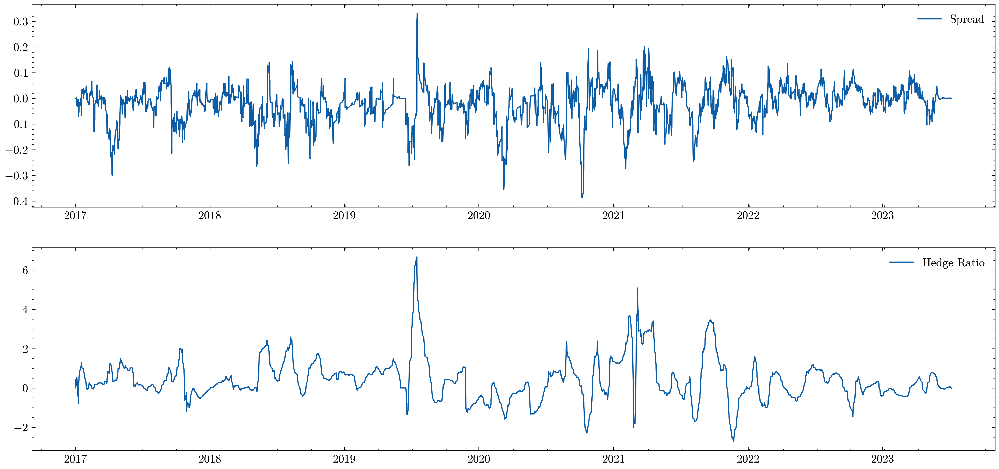

In [62]:
from statsmodels.regression.rolling import RollingOLS

model_rolling = RollingOLS(spread[chosen_pair[1]], sm.add_constant(spread[chosen_pair[0]]), window = 60, expanding = True)
res = model_rolling.fit(method= 'lstsq')

series = res.params.fillna(0)

predictions = spread[chosen_pair[0]]*series['EFID'] + series['const']

fig, ax = plt.subplots(2,1, figsize = (15,7), dpi = 400)

ax[0].plot(-spread[chosen_pair[1]] + predictions, label = 'Spread')
ax[0].legend()
ax[1].plot(series['EFID'], label = 'Hedge Ratio')
ax[1].legend()

In [63]:
from bayes_opt import BayesianOptimization

def rolling_model(window, set = train, tradeoff = 0.5):
    model = RollingOLS(set[chosen_pair[1]], sm.add_constant(set[chosen_pair[0]]), window = int(window), expanding = True, )

    res = model.fit(method= 'lstsq')
    series = res.params.fillna(0)
    predictions = set[chosen_pair[0]]*series['EFID']+ series['const']

    process = Ornstein_Uhlenbeck()
    spread = set[chosen_pair[1]] - predictions

    process.fit(spread, method = 'Least-squares')
    llikelihood = process.log_likelihood(spread)

    return llikelihood/tradeoff - tradeoff*(series['EFID'].diff().fillna(0)**2 + series['EFID']**2).sum()

optimizer = BayesianOptimization(
    f=rolling_model,
    pbounds={'window': (3, 500)},
    verbose=1,
    random_state=1,allow_duplicate_points = True
    
)

optimizer.set_gp_params(alpha=1)
optimizer.maximize(
    n_iter=20
)

|   iter    |  target   |  window   |
-------------------------------------


C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


| 2         | -703.3    | 361.0     |


C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


| 4         | -695.9    | 153.3     |


C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


| 5         | -449.1    | 75.94     |


C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g

| 13        | -437.9    | 73.84     |


C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g

Data point [500.] is not unique. 1 duplicates registered. Continuing ...


C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g

Data point [500.] is not unique. 2 duplicates registered. Continuing ...


C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


C:\Users\2000r\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [64]:
print(optimizer.max)
window = int(optimizer.max['params']['window'])

{'target': -437.857408688182, 'params': {'window': 73.84118197624349}}


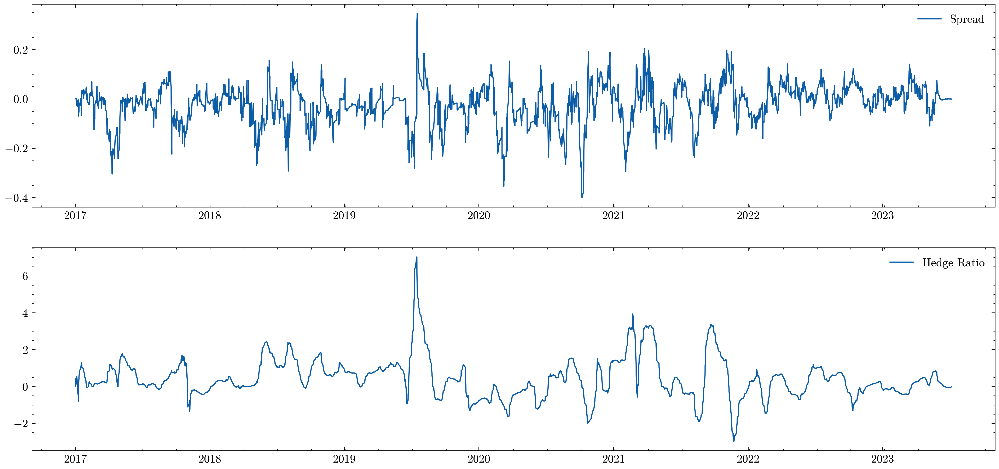

In [65]:
from statsmodels.regression.rolling import RollingOLS

model_rolling = RollingOLS(spread[chosen_pair[1]], sm.add_constant(spread[chosen_pair[0]]), window = window, expanding = True)
res = model_rolling.fit(method= 'lstsq')

series = res.params.fillna(0)
predictions = spread[chosen_pair[0]]*series['EFID'] + series['const']

fig, ax = plt.subplots(2,1, figsize = (15,7), dpi = 400)

ax[0].plot(-spread[chosen_pair[1]] + predictions, label = 'Spread')
ax[0].legend()
ax[1].plot(series['EFID'], label = 'Hedge Ratio')
ax[1].legend()

In [66]:
def pairs_signals(spread, threshold_enter, threshold_exit):
    positions = pd.Series(data = np.zeros(len(spread)), index = spread.index)
    position = 0
    max_hold_time = 74
    print('Beginning Backtest')
    for i in range(len(spread)):
        print(f'Day {i}')
        if position == 0:
            holding_time = 0
            print('Checking for available positions')
            if bool(spread.iloc[i] < threshold_enter and spread.iloc[i-1] > threshold_enter) is True:
                position = -1
                print('Shorting')
            elif bool(spread.iloc[i] > -threshold_enter and spread.iloc[i-1] < -threshold_enter) is True:
                position = 1
                print('Longing')
            else: 
                pass
        elif position == -1:
            holding_time += 1
            print(f'Checking for cover opportunities, hold time: {holding_time}, spread: {spread.iloc[i]}')
            if bool(spread.iloc[i] < threshold_exit and spread.iloc[i-1] > threshold_exit) is True:
                position = 0
                print('Covering Short Position')
            elif bool(holding_time > max_hold_time and np.abs(spread.iloc[i]) > 2*threshold_enter) is True:
                position = 0
                print('Closing for risk management')
            else: 
                pass
        elif position == 1:
            holding_time += 1
            print(f'Checking for sell opportunities, hold time: {holding_time}, spread: {spread.iloc[i]}')
            if bool(spread.iloc[i] > -threshold_exit and spread.iloc[i-1] < -threshold_exit) is True:
                position = 0
                print('Selling Long Position')
            elif bool(holding_time > max_hold_time and np.abs(spread.iloc[i]) > 2*threshold_enter) is True:
                position = 0
                print('Closing for risk management')
            else: 
                pass
        else: 
            continue

        positions.iloc[i] = position
    
    return positions

def backtest( returns, signals, commision_fixed = 4, commision_percentage = 0.008,initial_capital = 1000):
    fixed_costs = signals.diff().fillna(0)**2*commision_fixed
    returns = returns - commision_percentage*signals.diff().fillna(0)**2
    strategy_returns = returns.shift(-1).fillna(0)*signals
    value = strategy_returns.cumsum().apply(np.exp)
    value /= value.iloc[0]
    value *= initial_capital
    value -= fixed_costs.cumsum()
    value /= initial_capital

    return np.log(value)
    

Beginning Backtest
Day 0
Checking for available positions
Day 1
Checking for available positions
Day 2
Checking for available positions
Day 3
Checking for available positions
Day 4
Checking for available positions
Day 5
Checking for available positions
Day 6
Checking for available positions
Day 7
Checking for available positions
Day 8
Checking for available positions
Day 9
Checking for available positions
Longing
Day 10
Checking for sell opportunities, hold time: 1, spread: -0.003873228455055073
Day 11
Checking for sell opportunities, hold time: 2, spread: -0.03380605031912913
Day 12
Checking for sell opportunities, hold time: 3, spread: -0.0695139340446285
Day 13
Checking for sell opportunities, hold time: 4, spread: -0.055920016133491325
Day 14
Checking for sell opportunities, hold time: 5, spread: -0.05401032452795498
Day 15
Checking for sell opportunities, hold time: 6, spread: -0.02602996997656728
Day 16
Checking for sell opportunities, hold time: 7, spread: -0.026274398108749687


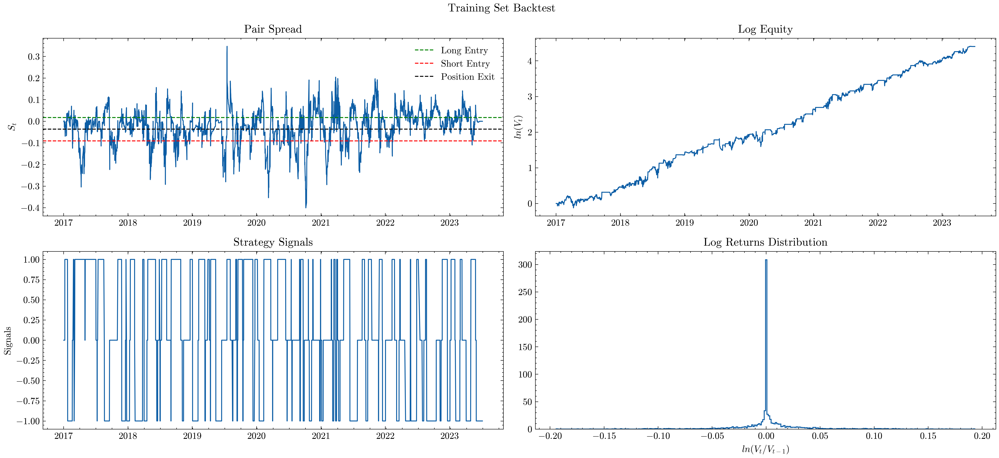

In [67]:
fig, ax = plt.subplots(2,2, figsize = (15,7), dpi = 400)
mean_reversion = Ornstein_Uhlenbeck()
residuals = -spread[chosen_pair[1]] + predictions
mean_reversion.fit(residuals.loc[train.index[0]:train.index[-1]], delta_t = 1/504)
ax[0,0].plot(residuals)
long_thres = mean_reversion.theta + 0.8*np.sqrt((mean_reversion.volatility)**2/(2*mean_reversion.mu))
short_thres = mean_reversion.theta - 0.8*np.sqrt((mean_reversion.volatility)**2/(2*mean_reversion.mu))
exit_thres = mean_reversion.theta
ax[0,0].axhline(long_thres, c = 'green', linestyle = '--', label = 'Long Entry')
ax[0,0].axhline(short_thres, c = 'red', linestyle = '--', label = 'Short Entry')
ax[0,0].axhline(exit_thres, c = 'black', linestyle = '--', label = 'Position Exit')
ax[0,0].legend()
signals = pairs_signals(residuals, long_thres, exit_thres)
ax[1,0].plot(signals)
log_returns_ = residuals.diff().fillna(0)
ax[0,1].plot(backtest(log_returns_, signals))
img = ax[1,1].hist(backtest(log_returns_, signals).diff().fillna(0), bins = 300, histtype = 'step', density= True)

ax[0,0].set_title('Pair Spread')
ax[1,0].set_title('Strategy Signals')
ax[0,1].set_title('Log Equity')
ax[1,1].set_title('Log Returns Distribution')

ax[0,1].set_ylabel(r'$ln(V_t)$')
ax[1,1].set_xlabel(r'$ln(V_t/V_{t-1})$')
ax[0,0].set_ylabel(r'$S_t$')
ax[1,0].set_ylabel(r'Signals')

fig.suptitle('Training Set Backtest')
fig.tight_layout()
